# ANL Rotating Hall Probe Run2

In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

## Imports

In [2]:
%load_ext autoreload
%autoreload 2

In [4]:
import numpy as np
import pandas as pd
import pickle as pkl
from scipy.special import sph_harm
import lmfit as lm # maybe try scipy.optimize.least_squares
from datetime import datetime
from dateutil import parser
from sys import getsizeof

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline
plt.rcParams['figure.figsize'] = (12.0, 8.0)
plt.rcParams['axes.axisbelow'] = True

from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import plotly.io as pio
from plotly import tools
init_notebook_mode(True)

from ipywidgets import interact, widgets
from IPython.display import IFrame
# from IPython.core.display import display, HTML

from hallprobecalib import hpc_ext_path
from hallprobecalib.hpcplots import scatter2d,scatter3d,histo, spherical_scatter3d

## Day 1: Importing/Cleaning Data, Initial Plots

### Data Prep

In [5]:
hpc_ext_path

'/home/ckampa/data/hallprobecalib_extras/'

In [6]:
datadir = '/home/ckampa/Dropbox/LogFiles/'

In [7]:
pkldir = hpc_ext_path+'datafiles/hall_probe_rotate/'

In [8]:
#datadir = hpc_ext_path+'datafiles/anl/'
datafile = '2019-05-11 092719.txt'
configfile = '2019-05-11 092743config.txt'

In [9]:
df_config = pd.read_csv(datadir+configfile) # not the best way to do this
df = pd.read_csv(datadir+datafile)

In [10]:
df_config

,,,,,,,,,,5/11/2019 9:27:43 AM
Angle0,Angle1,Step0,Step1,Resolution0,Resolution1,Center1,Center2,N_Hall_sensors,8E0000000D51483A,
360.000000000,360.000000000,3.636364000,3.636364000,100.000000000,100.000000000,0.000000000,0.000000000,1.000000000,0.000000000,NaN


In [11]:
df

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],8E0000000D51483A_Raw_X,8E0000000D51483A_Raw_Y,8E0000000D51483A_Raw_Z,8E0000000D51483A_Raw_T,8E0000000D51483A_Cal_X,8E0000000D51483A_Cal_Y,8E0000000D51483A_Cal_Z,8E0000000D51483A_Cal_T,SmarAct_Pattern_Angle_1,SmarAct_Pattern_Angle_2,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2
0,5/11/2019 9:33:49 AM,0.0,0.0,0.0,0.0,-192181.0,40276.0,4107238.0,23375.0,-1.448439,0.040449,0.027733,23.375,-180.000000,-180.000000,180.000000,-1.0,179.999998,-1.0
1,5/11/2019 9:34:00 AM,0.0,0.0,0.0,0.0,-185722.0,45089.0,4107197.0,23374.0,-1.448465,0.042255,0.025405,23.374,-180.000000,-176.363636,180.000000,-1.0,183.636359,-1.0
2,5/11/2019 9:34:10 AM,0.0,0.0,0.0,0.0,-178841.0,49307.0,4106998.0,23374.0,-1.448437,0.043846,0.022926,23.374,-180.000000,-172.727272,179.999998,-1.0,187.272723,-1.0
3,5/11/2019 9:34:20 AM,0.0,0.0,0.0,0.0,-171737.0,53119.0,4106850.0,23373.0,-1.448425,0.045291,0.020366,23.373,-180.000000,-169.090908,179.999996,-1.0,190.909089,-1.0
4,5/11/2019 9:34:29 AM,0.0,0.0,0.0,0.0,-164486.0,56567.0,4106666.0,23373.0,-1.448401,0.046605,0.017753,23.373,-180.000000,-165.454544,179.999998,-1.0,194.545450,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,5/12/2019 9:09:02 PM,0.0,0.0,0.0,0.0,-202213.0,-149310.0,4112271.0,21960.0,-1.448662,-0.028681,0.031178,21.960,180.000036,165.454580,180.000035,0.0,165.454578,0.0
9996,5/12/2019 9:09:12 PM,0.0,0.0,0.0,0.0,-202145.0,-149237.0,4112299.0,21959.0,-1.448671,-0.028654,0.031153,21.959,180.000036,169.090944,180.000033,0.0,169.090943,0.0
9997,5/12/2019 9:09:22 PM,0.0,0.0,0.0,0.0,-202231.0,-149256.0,4112186.0,21957.0,-1.448631,-0.028662,0.031185,21.957,180.000036,172.727308,180.000028,0.0,172.727308,0.0
9998,5/12/2019 9:09:32 PM,0.0,0.0,0.0,0.0,-202228.0,-149084.0,4112242.0,21955.0,-1.448649,-0.028599,0.031184,21.955,180.000036,176.363672,180.000031,0.0,176.363668,0.0


In [12]:
rename = [col for col in df.columns if "8E0000000D51483A_" in col]

In [13]:
rename

['8E0000000D51483A_Raw_X',
 ' 8E0000000D51483A_Raw_Y',
 ' 8E0000000D51483A_Raw_Z',
 ' 8E0000000D51483A_Raw_T',
 ' 8E0000000D51483A_Cal_X',
 ' 8E0000000D51483A_Cal_Y',
 ' 8E0000000D51483A_Cal_Z',
 ' 8E0000000D51483A_Cal_T']

In [14]:
rename[0].replace("8E0000000D51483A_","")

'Raw_X'

In [15]:
renamedict = {r: r.replace("8E0000000D51483A_","") for r in rename}

In [16]:
renamedict

{'8E0000000D51483A_Raw_X': 'Raw_X',
 ' 8E0000000D51483A_Raw_Y': ' Raw_Y',
 ' 8E0000000D51483A_Raw_Z': ' Raw_Z',
 ' 8E0000000D51483A_Raw_T': ' Raw_T',
 ' 8E0000000D51483A_Cal_X': ' Cal_X',
 ' 8E0000000D51483A_Cal_Y': ' Cal_Y',
 ' 8E0000000D51483A_Cal_Z': ' Cal_Z',
 ' 8E0000000D51483A_Cal_T': ' Cal_T'}

In [17]:
df.rename(columns=renamedict, inplace=True)

In [18]:
df

,Time,Magnet Current [V],Magnet Voltage [V],NMR [T],NMR [FFT],Raw_X,Raw_Y,Raw_Z,Raw_T,Cal_X,Cal_Y,Cal_Z,Cal_T,SmarAct_Pattern_Angle_1,SmarAct_Pattern_Angle_2,SmarAct_Meas_Angle_1,SmarAct_Meas_Rotation_Angle_1,SmarAct_Meas_Angle_2,SmarAct_Meas_Rotation_Angle_2
0,5/11/2019 9:33:49 AM,0.0,0.0,0.0,0.0,-192181.0,40276.0,4107238.0,23375.0,-1.448439,0.040449,0.027733,23.375,-180.000000,-180.000000,180.000000,-1.0,179.999998,-1.0
1,5/11/2019 9:34:00 AM,0.0,0.0,0.0,0.0,-185722.0,45089.0,4107197.0,23374.0,-1.448465,0.042255,0.025405,23.374,-180.000000,-176.363636,180.000000,-1.0,183.636359,-1.0
2,5/11/2019 9:34:10 AM,0.0,0.0,0.0,0.0,-178841.0,49307.0,4106998.0,23374.0,-1.448437,0.043846,0.022926,23.374,-180.000000,-172.727272,179.999998,-1.0,187.272723,-1.0
3,5/11/2019 9:34:20 AM,0.0,0.0,0.0,0.0,-171737.0,53119.0,4106850.0,23373.0,-1.448425,0.045291,0.020366,23.373,-180.000000,-169.090908,179.999996,-1.0,190.909089,-1.0
4,5/11/2019 9:34:29 AM,0.0,0.0,0.0,0.0,-164486.0,56567.0,4106666.0,23373.0,-1.448401,0.046605,0.017753,23.373,-180.000000,-165.454544,179.999998,-1.0,194.545450,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,5/12/2019 9:09:02 PM,0.0,0.0,0.0,0.0,-202213.0,-149310.0,4112271.0,21960.0,-1.448662,-0.028681,0.031178,21.960,180.000036,165.454580,180.000035,0.0,165.454578,0.0
9996,5/12/2019 9:09:12 PM,0.0,0.0,0.0,0.0,-202145.0,-149237.0,4112299.0,21959.0,-1.448671,-0.028654,0.031153,21.959,180.000036,169.090944,180.000033,0.0,169.090943,0.0
9997,5/12/2019 9:09:22 PM,0.0,0.0,0.0,0.0,-202231.0,-149256.0,4112186.0,21957.0,-1.448631,-0.028662,0.031185,21.957,180.000036,172.727308,180.000028,0.0,172.727308,0.0
9998,5/12/2019 9:09:32 PM,0.0,0.0,0.0,0.0,-202228.0,-149084.0,4112242.0,21955.0,-1.448649,-0.028599,0.031184,21.955,180.000036,176.363672,180.000031,0.0,176.363668,0.0


In [19]:
rename = [col for col in df.columns if "SmarAct_" in col]
renamedict = {r: r.replace("SmarAct_","") for r in rename}
df.rename(columns=renamedict, inplace=True)

In [20]:
df.columns

Index(['Time', ' Magnet Current [V]', ' Magnet Voltage [V]', 'NMR [T]',
       ' NMR [FFT]', 'Raw_X', ' Raw_Y', ' Raw_Z', ' Raw_T', ' Cal_X', ' Cal_Y',
       ' Cal_Z', ' Cal_T', '  Pattern_Angle_1', ' Pattern_Angle_2',
       ' Meas_Angle_1', ' Meas_Rotation_Angle_1', ' Meas_Angle_2',
       ' Meas_Rotation_Angle_2'],
      dtype='object')

In [21]:
df.drop(columns=[" Magnet Current [V]", ' Magnet Voltage [V]', 'NMR [T]', ' NMR [FFT]', " Raw_T"],inplace=True)

In [22]:
rename = df.columns
renamedict = {r: r.replace(" ","") for r in rename}
df.rename(columns=renamedict, inplace=True)

In [23]:
df.columns

Index(['Time', 'Raw_X', 'Raw_Y', 'Raw_Z', 'Cal_X', 'Cal_Y', 'Cal_Z', 'Cal_T',
       'Pattern_Angle_1', 'Pattern_Angle_2', 'Meas_Angle_1',
       'Meas_Rotation_Angle_1', 'Meas_Angle_2', 'Meas_Rotation_Angle_2'],
      dtype='object')

In [24]:
getsizeof(df) / 1000/1000

1.812673

In [25]:
df.eval('MAG_B_RAW = (Raw_X**2+Raw_Y**2+Raw_Z**2)**(1/2)',inplace=True)
df.eval('MAG_B_CAL = (Cal_X**2+Cal_Y**2+Cal_Z**2)**(1/2)',inplace=True)

In [26]:
# fix Angle_1 offset! messy but works for now...
df['Meas_Angle_1'] = df['Meas_Angle_1'] - 180.

In [27]:
df['Time'] = pd.to_datetime(df['Time'])

We now have a nice trimmed dataframe with easy to call columns.

In [28]:
# pkl.dump(df, open(pkldir+datafile.replace('.txt','.p'),'wb'))

In [29]:
df.to_pickle(pkldir+datafile.replace('.txt','.p'))

### Plotting (following Run 1 plots, 11-29-18 -- 12-03-18)

Import prepped dataframe.

- Using probe: 8E0000000D51483A

In [30]:
datadir = '/home/ckampa/Dropbox/LogFiles/'
pkldir = hpc_ext_path+'datafiles/hall_probe_rotate/'
datafile = '2019-05-11 092719.txt'
configfile = '2019-05-11 092743config.txt'

In [31]:
#plotdir = "/home/ckampa/Dropbox/research/deliverables/plots/anl_run2/"
plotdir = hpc_ext_path+'plots/hall_probe_rotate/2019-05-11_ANL/'

In [32]:
#df = pkl.load(open(datadir+datafile.replace('.txt','.p'),'rb'))

In [33]:
df = pd.read_pickle(pkldir+datafile.replace('.txt', '.p'))

In [34]:
df.columns

Index(['Time', 'Raw_X', 'Raw_Y', 'Raw_Z', 'Cal_X', 'Cal_Y', 'Cal_Z', 'Cal_T',
       'Pattern_Angle_1', 'Pattern_Angle_2', 'Meas_Angle_1',
       'Meas_Rotation_Angle_1', 'Meas_Angle_2', 'Meas_Rotation_Angle_2',
       'MAG_B_RAW', 'MAG_B_CAL'],
      dtype='object')

In [35]:
for raw in ["Raw_X", "Raw_Y", "Raw_Z"]:
    fig = scatter2d(3*[df[raw]], [df[col] for col in ["Cal_X", "Cal_Y", "Cal_Z"]],\
                    lines=False, markers=True, inline=False);

    filename = f"{plotdir}Cal_XYZ_vs_{raw}"
    pio.write_html(fig, filename+".html")
    pio.write_image(fig, filename+".pdf")
    pio.write_image(fig, filename+".png")

In [36]:
scatter2d(df.Time,df.MAG_B_CAL,inline=True);

In [37]:
df.columns

Index(['Time', 'Raw_X', 'Raw_Y', 'Raw_Z', 'Cal_X', 'Cal_Y', 'Cal_Z', 'Cal_T',
       'Pattern_Angle_1', 'Pattern_Angle_2', 'Meas_Angle_1',
       'Meas_Rotation_Angle_1', 'Meas_Angle_2', 'Meas_Rotation_Angle_2',
       'MAG_B_RAW', 'MAG_B_CAL'],
      dtype='object')

In [38]:
fig = histo(df.MAG_B_CAL,bins=100,inline=True);

In [39]:
fig.layout.shapes= [
        # Line Vertical
        {
            'type': 'line',
            'x0': 1.449497806,
            'y0': 0,
            'x1': 1.449497806,
            'y1': 645,
            'line': {
                'color': 'rgb(078, 042, 132)',
                'width': 3,
                'dash' : 'dash'
            },
        },
]

In [40]:
fig.add_scatter(x=[1.449575],
                y=[300],
                text=["Nominal Field<br>B = 1.449498"],
                mode='text',
                showlegend=False);

In [41]:
pio.write_image(fig, plotdir+'hist_mag_b_cal.pdf')
pio.write_image(fig, plotdir+'hist_mag_b_cal.png')

In [42]:
iplot(fig)

Is there a dependence on the angle and the calibrated magnetic field?

In [43]:
scatter2d(df.Meas_Angle_1,df.MAG_B_CAL,lines=False,markers=True,inline=False);

In [44]:
scatter2d(df.Meas_Angle_2,df.MAG_B_CAL,lines=False,markers=True,inline=False);

Seems to be more dependent on Angle_1.

Now check "Pattern" vs. "Measured" angle.

In [45]:
scatter2d([df.Time,df.Time],[df.Pattern_Angle_1,df.Meas_Angle_1],inline=True);

In [46]:
#scatter2d([df.Time,df.Time],[df.Pattern_Angle_2,df.Meas_Angle_2],inline=True);
scatter2d([df.Time,df.Time],[df.Pattern_Angle_2,df.Meas_Angle_2],lines=False,markers=True,inline=True);

There still appears to be an issue with Angle 2, starting at 5/12/19 2am.

Start some fun 3d plotting!

### 3D Spherical

In [47]:
# cut out double count

In [48]:
df = df[df.Meas_Angle_1 >= 0.]

In [49]:
df_fnal = df[(df.Meas_Angle_1 > -15.) & (df.Meas_Angle_1 < 15.)]

In [50]:
df_fnal_m = df[(df.Meas_Angle_1 < -180.+15.) | (df.Meas_Angle_1 > 180.-15.)]

In [51]:
spherical_scatter3d(df_fnal.Meas_Angle_2,df_fnal.Meas_Angle_1,df_fnal.Raw_Z,inline=False);

In [60]:
spherical_scatter3d(3*[df_fnal.Meas_Angle_2],3*[df_fnal.Meas_Angle_1],[df_fnal.Raw_X,df_fnal.Raw_Y,df_fnal.Raw_Z],inline=False);

In [61]:
spherical_scatter3d([df.Meas_Angle_2, df_fnal.Meas_Angle_2,],[df.Meas_Angle_1, df_fnal.Meas_Angle_1,],[df.Raw_Z, df_fnal.Raw_Z,],colors_list=["Viridis", "Hot",],inline=False);

In [62]:
spherical_scatter3d([df.Meas_Angle_2, df_fnal.Meas_Angle_2, df_fnal_m.Meas_Angle_2],[df.Meas_Angle_1, df_fnal.Meas_Angle_1, df_fnal_m.Meas_Angle_1],[df.Raw_Z, df_fnal.Raw_Z, df_fnal_m.Raw_Z],colors_list=["Viridis", "Hot", "Hot",],inline=False);

In [63]:
for B in ["Raw_X", "Raw_Y", "Raw_Z"]:
    fig = spherical_scatter3d([df.Meas_Angle_2, df_fnal.Meas_Angle_2, df_fnal_m.Meas_Angle_2],[df.Meas_Angle_1, df_fnal.Meas_Angle_1, df_fnal_m.Meas_Angle_1],[df[B], df_fnal[B], df_fnal_m[B]],colors_list=["Viridis", "Hot", "Hot",],inline=False);

In [64]:
spherical_scatter3d(df.Meas_Angle_2,df.Meas_Angle_1,df.Raw_Z,inline=False);

We double count the angle, so let's try looking at the first half of the data, for now.

In [65]:
#t = df.Time <  pd.Timestamp(2019,5,12,2,0,0)
#df = df[t]

In [66]:
df = df[df.index <= 4999]
#df = df[df.index <= 4999+100]

In [67]:
df

,Time,Raw_X,Raw_Y,Raw_Z,Cal_X,Cal_Y,Cal_Z,Cal_T,Pattern_Angle_1,Pattern_Angle_2,Meas_Angle_1,Meas_Rotation_Angle_1,Meas_Angle_2,Meas_Rotation_Angle_2,MAG_B_RAW,MAG_B_CAL
0,2019-05-11 09:33:49,-192181.0,40276.0,4107238.0,-1.448439,0.040449,0.027733,23.375,-180.000000,-180.000000,0.000000,-1.0,179.999998,-1.0,4.111929e+06,1.449270
1,2019-05-11 09:34:00,-185722.0,45089.0,4107197.0,-1.448465,0.042255,0.025405,23.374,-180.000000,-176.363636,0.000000,-1.0,183.636359,-1.0,4.111641e+06,1.449303
22,2019-05-11 09:37:26,-27593.0,33655.0,4105315.0,-1.448412,0.039342,-0.031672,23.349,-180.000000,-99.999992,0.000002,-1.0,260.000004,-1.0,4.105546e+06,1.449293
26,2019-05-11 09:38:05,-5953.0,9130.0,4105231.0,-1.448397,0.030577,-0.039502,23.343,-180.000000,-85.454536,0.000002,-1.0,274.545459,-1.0,4.105245e+06,1.449259
57,2019-05-11 09:43:08,-87157.0,-186055.0,4108754.0,-1.448671,-0.041174,-0.010365,23.303,-180.000000,27.272748,0.000002,-1.0,27.272745,0.0,4.113888e+06,1.449293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2019-05-12 04:00:55,137375.0,48165.0,-4114764.0,1.449349,-0.002176,-0.001595,21.123,-1.818164,165.454580,178.181832,-1.0,165.454578,0.0,4.117338e+06,1.449352
4996,2019-05-12 04:01:05,137467.0,48240.0,-4114839.0,1.449374,-0.002148,-0.001627,21.122,-1.818164,169.090944,178.181838,-1.0,169.090940,0.0,4.117417e+06,1.449376
4997,2019-05-12 04:01:15,137395.0,48346.0,-4114742.0,1.449341,-0.002110,-0.001602,21.123,-1.818164,172.727308,178.181836,-1.0,172.727305,0.0,4.117319e+06,1.449344
4998,2019-05-12 04:01:25,137360.0,48262.0,-4114876.0,1.449386,-0.002141,-0.001588,21.121,-1.818164,176.363672,178.181836,-1.0,176.363667,0.0,4.117451e+06,1.449388


In [68]:
spherical_scatter3d(df.Meas_Angle_2,df.Meas_Angle_1,df.Raw_Z,inline=False);

In [69]:
spherical_scatter3d(3*[df.Meas_Angle_2],3*[df.Meas_Angle_1],[df.Raw_X,df.Raw_Y,df.Raw_Z],colors_list=['Hot','Portland','Viridis'],inline=False);

Note that we can see here that the 3 probes are in a left-handed configuration. We should invert one of the voltage readings. See below to see which.

### $B_i$ vs. $\theta,\phi$

In [70]:
df3 = df

In [71]:
s = 2

'''
trace11 = go.Scatter(x=df3.Pattern_Angle_1,y=df3.Cal_X)#, mode = 'markers', marker = dict(size = s))
trace12 = go.Scatter(x=df3.Pattern_Angle_2,y=df3.Cal_X)#, mode = 'markers', marker = dict(size = s))
trace21 = go.Scatter(x=df3.Pattern_Angle_1,y=df3.Cal_Y)#, mode = 'markers', marker = dict(size = s))
trace22 = go.Scatter(x=df3.Pattern_Angle_2,y=df3.Cal_Y)#, mode = 'markers', marker = dict(size = s))
trace31 = go.Scatter(x=df3.Pattern_Angle_1,y=df3.Cal_Z)#, mode = 'markers', marker = dict(size = s))
trace32 = go.Scatter(x=df3.Pattern_Angle_2,y=df3.Cal_Z)#, mode = 'markers', marker = dict(size = s))
trace41 = go.Scatter(x=df3.Pattern_Angle_1,y=df3.MAG_B_CAL)#, mode = 'markers', marker = dict(size = s))
trace42 = go.Scatter(x=df3.Pattern_Angle_2,y=df3.MAG_B_CAL)#, mode = 'markers', marker = dict(size = s))
'''
'''
trace11 = go.Scatter(x=df3.Pattern_Angle_1,y=df3.Raw_X)#, mode = 'markers', marker = dict(size = s))
trace12 = go.Scatter(x=df3.Pattern_Angle_2,y=df3.Raw_X)#, mode = 'markers', marker = dict(size = s))
trace21 = go.Scatter(x=df3.Pattern_Angle_1,y=df3.Raw_Y)#, mode = 'markers', marker = dict(size = s))
trace22 = go.Scatter(x=df3.Pattern_Angle_2,y=df3.Raw_Y)#, mode = 'markers', marker = dict(size = s))
trace31 = go.Scatter(x=df3.Pattern_Angle_1,y=df3.Raw_Z)#, mode = 'markers', marker = dict(size = s))
trace32 = go.Scatter(x=df3.Pattern_Angle_2,y=df3.Raw_Z)#, mode = 'markers', marker = dict(size = s))
trace41 = go.Scatter(x=df3.Pattern_Angle_1,y=df3.MAG_B_RAW)#, mode = 'markers', marker = dict(size = s))
trace42 = go.Scatter(x=df3.Pattern_Angle_2,y=df3.MAG_B_RAW)#, mode = 'markers', marker = dict(size = s))
'''
trace11 = go.Scatter(x=df3.Meas_Angle_1,y=df3.Raw_X, mode = 'markers', marker = dict(size = s))
trace12 = go.Scatter(x=df3.Meas_Angle_2,y=df3.Raw_X, mode = 'markers', marker = dict(size = s))
trace21 = go.Scatter(x=df3.Meas_Angle_1,y=df3.Raw_Y, mode = 'markers', marker = dict(size = s))
trace22 = go.Scatter(x=df3.Meas_Angle_2,y=df3.Raw_Y, mode = 'markers', marker = dict(size = s))
trace31 = go.Scatter(x=df3.Meas_Angle_1,y=df3.Raw_Z, mode = 'markers', marker = dict(size = s))
trace32 = go.Scatter(x=df3.Meas_Angle_2,y=df3.Raw_Z, mode = 'markers', marker = dict(size = s))
trace41 = go.Scatter(x=df3.Meas_Angle_1,y=df3.MAG_B_RAW, mode = 'markers', marker = dict(size = s))
trace42 = go.Scatter(x=df3.Meas_Angle_2,y=df3.MAG_B_RAW, mode = 'markers', marker = dict(size = s))

fig = tools.make_subplots(rows=4, cols=2, subplot_titles=('Bx vs. Angle_1', 'Bx vs. Angle_2',
                                                          'By vs. Angle_1', 'By vs. Angle_2',
                                                          'Bz vs. Angle_1', 'Bz vs. Angle_2',
                                                          'B_mag vs. Angle_1', 'B_mag vs. Angle_2'))

fig.append_trace(trace11, 1,1)
fig.append_trace(trace12, 1,2)
fig.append_trace(trace21, 2,1)
fig.append_trace(trace22, 2,2)
fig.append_trace(trace31, 3,1)
fig.append_trace(trace32, 3,2)
fig.append_trace(trace41, 4,1)
fig.append_trace(trace42, 4,2)


fig['layout']['xaxis1'].update(title='Angle_1 (deg)')
fig['layout']['xaxis2'].update(title='Angle_2 (deg)')
fig['layout']['xaxis3'].update(title='Angle_1 (deg)')
fig['layout']['xaxis4'].update(title='Angle_2 (deg)')
fig['layout']['xaxis5'].update(title='Angle_1 (deg)')
fig['layout']['xaxis6'].update(title='Angle_2 (deg)')
fig['layout']['xaxis7'].update(title='Angle_1 (deg)')
fig['layout']['xaxis8'].update(title='Angle_2 (deg)')

fig['layout']['yaxis1'].update(title='B (T)')
fig['layout']['yaxis2'].update(title='B (T)')
fig['layout']['yaxis3'].update(title='B (T)')
fig['layout']['yaxis4'].update(title='B (T)')
fig['layout']['yaxis5'].update(title='B (T)')
fig['layout']['yaxis6'].update(title='B (T)')
fig['layout']['yaxis7'].update(title='B (T)')
fig['layout']['yaxis8'].update(title='B (T)')


fig['layout'].update(height=1200, width=1000, title='ANL Run 2 (Start: 05/11/19 9:33): Raw Measurements', showlegend=False)

plot(fig, filename=plotdir+'Raw_B_vs_Angles.html')
pio.write_image(fig, plotdir+'Raw_B_vs_Angles.pdf')
pio.write_image(fig, plotdir+'Raw_B_vs_Angles.png')

/home/ckampa/anaconda3/envs/mu2e/lib/python3.8/site-packages/plotly/tools.py:461: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



In [72]:
#iplot(fig)

### Calculating Direction of B ($\theta,\phi$)

In [73]:
df['Theta_Raw'] = np.arctan2(np.sqrt(df.Raw_X**2+df.Raw_Y**2),df.Raw_Z)*180/np.pi
#df['Theta_Cal'] = np.arctan2(np.sqrt(df.Cal_X**2+df.Cal_Y**2),df.Cal_Z)*180/np.pi
df['Theta_Cal'] = np.arctan2(np.sqrt(-df.Cal_Z**2+df.Cal_Y**2),-df.Cal_X)*180/np.pi
df['Phi_Raw'] = np.arctan2(df.Raw_Y,df.Raw_X)*180/np.pi
#df['Phi_Cal'] = np.arctan2(df.Cal_Y,df.Cal_X)*180/np.pi
df['Phi_Cal'] = np.arctan2(df.Cal_Y,-df.Cal_Z)*180/np.pi

/home/ckampa/anaconda3/envs/mu2e/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning:

invalid value encountered in sqrt



In [74]:
histo(df.Meas_Angle_1,bins=25,inline=True);
histo(df.Meas_Angle_2,bins=25,inline=True);

In [75]:
histo(df.Theta_Cal,bins=50,inline=True);
histo(df.Theta_Raw,bins=50,inline=True);
histo(df.Phi_Cal,bins=50,inline=True);
histo(df.Phi_Raw,bins=50,inline=True);

In [76]:
scatter2d(df.Meas_Angle_1,df.Theta_Cal,lines=False,markers=True,inline=True);
scatter2d(df.Meas_Angle_1,df.Theta_Raw,lines=False,markers=True,inline=True);

In [77]:
scatter2d(df.Meas_Angle_2,df.Phi_Cal,lines=False,markers=True,size_list=[4],inline=True);
scatter2d(df.Meas_Angle_2,df.Phi_Raw,lines=False,markers=True,size_list=[4],inline=True);

Theta looks decent, but Phi is clearly screwed up...try to determine the angle of each probe to "Measured Angle_1 Angle_2".

### Orthogonality of Probes

In [78]:
xmax = df[df.Raw_X == df.Raw_X.max()]
xmax

,Time,Raw_X,Raw_Y,Raw_Z,Cal_X,Cal_Y,Cal_Z,Cal_T,Pattern_Angle_1,Pattern_Angle_2,Meas_Angle_1,Meas_Rotation_Angle_1,Meas_Angle_2,Meas_Rotation_Angle_2,MAG_B_RAW,MAG_B_CAL,Theta_Raw,Theta_Cal,Phi_Raw,Phi_Cal
2536,2019-05-11 18:59:01,4127308.0,18012.0,-246460.0,0.069873,0.034488,-1.447142,22.408,-89.0909,-49.090896,90.909102,-1.0,310.9091,-1.0,4.134699e+06,1.449238,93.417297,NaN,0.250043,1.365186


In [79]:
ymax = df[df.Raw_Y == df.Raw_Y.max()]
ymax

,Time,Raw_X,Raw_Y,Raw_Z,Cal_X,Cal_Y,Cal_Z,Cal_T,Pattern_Angle_1,Pattern_Angle_2,Meas_Angle_1,Meas_Rotation_Angle_1,Meas_Angle_2,Meas_Rotation_Angle_2,MAG_B_RAW,MAG_B_CAL,Theta_Raw,Theta_Cal,Phi_Raw,Phi_Cal
2411,2019-05-11 18:32:26,-168195.0,4086223.0,30572.0,-0.019147,1.447899,0.060054,22.473,-92.727264,-139.999996,87.272724,-1.0,219.999997,-1.0,4.089797e+06,1.44927,89.571699,89.241716,92.357049,92.375088


In [80]:
zmax = df[df.Raw_Z == df.Raw_Z.max()]
zmax

,Time,Raw_X,Raw_Y,Raw_Z,Cal_X,Cal_Y,Cal_Z,Cal_T,Pattern_Angle_1,Pattern_Angle_2,Meas_Angle_1,Meas_Rotation_Angle_1,Meas_Angle_2,Meas_Rotation_Angle_2,MAG_B_RAW,MAG_B_CAL,Theta_Raw,Theta_Cal,Phi_Raw,Phi_Cal
88,2019-05-11 09:48:12,-237637.0,-32315.0,4109016.0,-1.448581,0.013639,0.044072,23.262,-180.0,140.000032,1.000000e-06,-1.0,140.000026,0.0,4.116009e+06,1.449315,3.340298,NaN,-172.256149,162.804504


In [81]:
xx = []
yy = []
zz = []
for coord in [xmax,ymax,zmax]:
    PHI = (coord.Meas_Angle_2.values)*np.pi/180
    THETA = (coord.Meas_Angle_1.values)*np.pi/180
    R = np.ones(1)
    X = np.insert(R * np.sin(THETA) * np.cos(PHI),0,0)
    Y = np.insert(R * np.sin(THETA) * np.sin(PHI),0,0)
    Z = np.insert(R * np.cos(THETA),0,0)
    xx.append(pd.Series(X,name=f'X'))
    yy.append(pd.Series(Y,name=f'Y'))
    zz.append(pd.Series(Z,name=f'Z'))
#xx = pd.Series(xx,name='X')
#yy = pd.Series(yy,name='Y')
#zz = pd.Series(zz,name='Z')

In [82]:
xx

[0    0.000000
 1    0.654778
 Name: X, dtype: float64,
 0    0.000000
 1   -0.765177
 Name: X, dtype: float64,
 0    0.000000e+00
 1   -1.337000e-08
 Name: X, dtype: float64]

In [83]:
scatter3d(xx,yy,zz,scale_list=3*[pd.Series([0,0],name='na')],mode_list=3*['lines'],inline=False);

#### Adjust measurements
- Flip one voltage for right-handed set of voltages
- Fix $B_z$ to "true" z-axis (fix theta), and fix $B_x$ to "true" x-axis (fix phi).
    - This constrains us to 3 angles describing the non-orthogonality of the probes, rather than 6.

In [84]:
df['Raw_Y'] = -1.*df['Raw_Y']

In [85]:
df['Meas_Angle_2'] = df['Meas_Angle_2']-310.9091
df['Meas_Angle_2'] = pd.Series([row.Meas_Angle_2 if row.Meas_Angle_2 >= 0 else row.Meas_Angle_2+360. for row in df.itertuples()])

In [86]:
#df['Meas_Angle_2'] = df['Meas_Angle_2']+(360.-310.9091)
#reset
#df['Meas_Angle_2'] = df['Meas_Angle_2']-(360.-310.9091)

In [87]:
#df['Meas_Angle_2'] = -1.*df['Meas_Angle_2']+360.
#df['Meas_Angle_2'] = -1.*df['Meas_Angle_2']+360.

In [88]:
#reset
#df['Meas_Angle_2'] = -1.*(df['Meas_Angle_2']-360.)

Now with fixed measured angles!

In [89]:
xmax = df[df.Raw_X == df.Raw_X.max()]
xmax

,Time,Raw_X,Raw_Y,Raw_Z,Cal_X,Cal_Y,Cal_Z,Cal_T,Pattern_Angle_1,Pattern_Angle_2,Meas_Angle_1,Meas_Rotation_Angle_1,Meas_Angle_2,Meas_Rotation_Angle_2,MAG_B_RAW,MAG_B_CAL,Theta_Raw,Theta_Cal,Phi_Raw,Phi_Cal
2536,2019-05-11 18:59:01,4127308.0,-18012.0,-246460.0,0.069873,0.034488,-1.447142,22.408,-89.0909,-49.090896,90.909102,-1.0,338.18181,-1.0,4.134699e+06,1.449238,93.417297,NaN,0.250043,1.365186


In [90]:
ymax = df[df.Raw_Y == df.Raw_Y.max()]
ymax

,Time,Raw_X,Raw_Y,Raw_Z,Cal_X,Cal_Y,Cal_Z,Cal_T,Pattern_Angle_1,Pattern_Angle_2,Meas_Angle_1,Meas_Rotation_Angle_1,Meas_Angle_2,Meas_Rotation_Angle_2,MAG_B_RAW,MAG_B_CAL,Theta_Raw,Theta_Cal,Phi_Raw,Phi_Cal
2461,2019-05-11 18:40:41,-903.0,4089648.0,116197.0,-0.027393,-1.449086,-0.006937,22.461,-92.727264,41.818204,87.272733,-1.0,69.090922,0.0,4.091298e+06,1.449362,88.372523,88.916999,-90.012651,-89.725728


In [91]:
zmax = df[df.Raw_Z == df.Raw_Z.max()]
zmax

,Time,Raw_X,Raw_Y,Raw_Z,Cal_X,Cal_Y,Cal_Z,Cal_T,Pattern_Angle_1,Pattern_Angle_2,Meas_Angle_1,Meas_Rotation_Angle_1,Meas_Angle_2,Meas_Rotation_Angle_2,MAG_B_RAW,MAG_B_CAL,Theta_Raw,Theta_Cal,Phi_Raw,Phi_Cal
88,2019-05-11 09:48:12,-237637.0,32315.0,4109016.0,-1.448581,0.013639,0.044072,23.262,-180.0,140.000032,1.000000e-06,-1.0,167.272745,0.0,4.116009e+06,1.449315,3.340298,NaN,-172.256149,162.804504


In [92]:
xx = []
yy = []
zz = []
for coord in [xmax,ymax,zmax]:
    PHI = (coord.Meas_Angle_2.values)*np.pi/180
    THETA = (coord.Meas_Angle_1.values)*np.pi/180
    R = np.ones(1)
    X = np.insert(R * np.sin(THETA) * np.cos(PHI),0,0)
    Y = np.insert(R * np.sin(THETA) * np.sin(PHI),0,0)
    Z = np.insert(R * np.cos(THETA),0,0)
    xx.append(pd.Series(X,name=f'X'))
    yy.append(pd.Series(Y,name=f'Y'))
    zz.append(pd.Series(Z,name=f'Z'))
#xx = pd.Series(xx,name='X')
#yy = pd.Series(yy,name='Y')
#zz = pd.Series(zz,name='Z')

In [93]:
scatter3d(xx,yy,zz,scale_list=3*[pd.Series([0,0],name='na')],mode_list=3*['lines'],inline=False);

In [94]:
spherical_scatter3d(df.Meas_Angle_2,df.Meas_Angle_1,df.Raw_Z,inline=False);

In [95]:
spherical_scatter3d(3*[df.Meas_Angle_2],3*[df.Meas_Angle_1],[df.Raw_X,df.Raw_Y,df.Raw_Z],colors_list=['Hot','Portland','Viridis'],inline=False);

### Spherical Harmonics

In [96]:
def hall_voltage(theta,phi, A, phase_theta0, phase_phi0):
    #voltage = np.zeros_like(theta)
    #voltage = ( -A11_*sph_harm(-1,1,np.radians(phi+phase_phi1_),np.radians(theta+phase_theta1_)).imag
    #           + A10*sph_harm(0,1,np.radians(phi+phase_phi0),np.radians(theta+phase_theta0)).real
    #           - A11*sph_harm(1,1,np.radians(phi+phase_phi1),np.radians(theta+phase_theta1))).real
    voltage = A*sph_harm(0,1,np.radians(phi+phase_phi0),np.radians(theta+phase_theta0)).real
    return voltage

def hall_voltage2(theta,phi, A11_,phase_phi1_,phase_theta1_, A10,phase_phi0,phase_theta0, A11,phase_phi1,phase_theta1):
    #voltage = np.zeros_like(theta)
    voltage = ( -A11_*sph_harm(-1,1,np.radians(phi+phase_phi1_),np.radians(theta+phase_theta1_)).imag
               + A10*sph_harm(0,1,np.radians(phi+phase_phi0),np.radians(theta+phase_theta0)).real
               - A11*sph_harm(1,1,np.radians(phi+phase_phi1),np.radians(theta+phase_theta1))).real
    #voltage = ( -A11_*abs(sph_harm(-1,1,np.radians(phi+phase_phi1_),np.radians(theta+phase_theta1_)))
    #           + A10*abs(sph_harm(0,1,np.radians(phi+phase_phi0),np.radians(theta+phase_theta0)))
    #           - A11*abs(sph_harm(1,1,np.radians(phi+phase_phi1),np.radians(theta+phase_theta1))))
   
    return voltage

'''
def hall_voltage(theta,phi, A,ephi,etheta,epsi):
    # e for euler angles
    rad = np.radians
    sin = np.sin
    cos = np.cos
    theta = rad(theta)
    phi = rad(phi)
    etheta = rad(etheta)
    ephi = rad(ephi)
    epsi = rad(epsi)
    
    x = A * sin(theta) * cos(phi) 
    y = A * sin(theta) * sin(phi)
    z = A * cos(theta)
    a = [[[cos(epsi)*cos(ephi)-cos(etheta)*sin(ephi)*sin(epsi)],[cos(epsi)*sin(ephi)+cos(etheta)*cos(ephi)*sin(epsi)],[sin(epsi)*sin(etheta)]],
         [[-sin(epsi)*cos(ephi)-cos(etheta)*sin(ephi)*cos(epsi)],[-sin(epsi)*sin(ephi)+cos(etheta)*cos(ephi)*cos(epsi)],[cos(epsi)*sin(etheta)]],
         [[sin(etheta)*sin(ephi)],[-sin(etheta)*cos(ephi)],[cos(etheta)]]]
    xp = a[0][0] * x + a[0][1] * y + a[0][2] * z
    yp = a[1][0] * x + a[1][1] * y + a[1][2] * z
    zp = a[2][0] * x + a[2][1] * y + a[2][2] * z
    rp = (xp**2+yp**2+zp**2)**(1/2)
    thetap = np.arctan((xp**2 + yp**2)**(1/2)/zp)
    phip = np.arctan(yp/xp)
    voltage = rp*sph_harm(0,1,phip,thetap).real
    return voltage
''';

In [102]:
#define a model!
#model = lm.Model(hall_voltage, independent_vars=['theta','phi'])
model = lm.Model(hall_voltage2, independent_vars=['theta','phi'])
#define and initialize free param(s)
params = lm.Parameters()


params.add('A', value=0)
#params.add('A', value=4000000)
params.add('phase_phi0', value=0)
params.add('phase_theta0', value=0)



params.add('A11_', value=0)
params.add('phase_phi1_', value=0, min=0.,max=360.)#,vary=False)
params.add('phase_theta1_', value=0, min=0.,max=180.)#,vary=False)
params.add('A10', value=0)
params.add('phase_phi0', value=0, min=0.,max=360.)#,vary=False)
params.add('phase_theta0', value=0, min=0.,max=180.)#,vary=False)
params.add('A11', value=0)
params.add('phase_phi1', value=0, min=0.,max=360.)#,vary=False)
params.add('phase_theta1', value=0, min=0.,max=180.)#,vary=False)


'''
params.add('A', value=10)
params.add('ephi', value=0, min=-180, max=180)
params.add('etheta', value=0, min=-180, max=180)
params.add('epsi', value=0, min=0-180, max=180)
''';

In [103]:
# test a fit on BZ!
df['B_TEST'] = df.Raw_Z
#df['B_TEST'] = df.Raw_X
#df['B_TEST'] = df.Raw_Y
# concat samples...silly here because we are just studying 1 probe, so 1 voltage only!
samples = np.concatenate([df.B_TEST.values])

In [104]:
result = model.fit(samples, theta=df.Meas_Angle_1.values, phi=df.Meas_Angle_2.values, params = params)

ValueError: The model function generated NaN values and the fit aborted! Please check your model function and/or set boundaries on parameters where applicable. In cases like this, using "nan_policy='omit'" will probably not work.

In [105]:
print(result.fit_report())

NameError: name 'result' is not defined

In [106]:
results_full = result.eval(theta=df.Meas_Angle_1,phi=df.Meas_Angle_2)
init_full = result.eval(theta=df.Meas_Angle_1,phi=df.Meas_Angle_2,params=params)
df["B_FIT"] = results_full
df["B_FIT_INIT"] = init_full

NameError: name 'result' is not defined

In [107]:
fig = spherical_scatter3d(phi_list=2*[df.Meas_Angle_2],
                    theta_list=2*[df.Meas_Angle_1],
                    r_list=[df.B_FIT,df.B_TEST],
                    units_list = ['a.u.','a.u.'],
                    colors_list = ['Portland','Viridis'],
                    opacity_list=[0.65,1],size_list=[2,1],
                    title='Test Spherical Harmonic',inline=False);

AttributeError: 'DataFrame' object has no attribute 'B_FIT'

In [108]:
#plot(fig)

In [56]:
spherical_scatter3d(phi_list=[df.Meas_Angle_2],
                    theta_list=[df.Meas_Angle_1],
                    r_list=[df.Raw_Z],
                    units_list = ['10^-6 V'],
                    colors_list = ['Viridis'],
                    opacity_list=0.85,size_list=2,absval=True,
                    title='$B_z \\text{ Hall Voltage}$',inline=False)

df['RES'] = df.B_TEST-df.B_FIT
#r = (df.RES < df.RES.quantile(0.95)) & (df.RES > df.RES.quantile(0.05))
#r = (df.RES < df.RES.quantile(0.99)) & (df.RES > df.RES.quantile(0.01))
r = df.MAG_B_CAL != 0
spherical_scatter3d(phi_list=[df[r].Meas_Angle_2],
                    theta_list=[df[r].Meas_Angle_1],
                    r_list=[df[r].RES],
                    units_list = ['10^-6 V'],
                    colors_list = ['Viridis'],
                    opacity_list=[0.85],size_list=[2],
                    title="$\\text{Residuals of } Y_{10} \\text{ Fit: } B_z \\text{ Hall Voltage}$",inline=False);

### Fit via Integration (orthogonal $Y_{lm}$) (No reasonable results yet)

In [109]:
#df_ = df.sort_values(by=['Meas_Angle_1','Meas_Angle_2'])
df_ = df.sort_values(by=['Pattern_Angle_1','Pattern_Angle_2'])

In [110]:
#Vz = df_['Raw_Z']
Vz = 1 * np.ones_like(df_['Raw_Z'])
Y_10 = sph_harm(0,1,np.radians(df_['Meas_Angle_2']),np.radians(df_['Meas_Angle_1']))

NotImplementedError: Cannot apply ufunc <ufunc 'sph_harm'> to mixed DataFrame and Series inputs.

In [111]:
Y_10

NameError: name 'Y_10' is not defined

In [112]:
np.conj(Y_10)

NameError: name 'Y_10' is not defined

In [113]:
integrand = np.sin(np.radians(df['Meas_Angle_1'])) * Vz * np.conj(Y_10)

NameError: name 'Y_10' is not defined

In [114]:
integrand

NameError: name 'integrand' is not defined

In [115]:
theta = np.radians(df_['Meas_Angle_1'])
phi = np.radians(df_['Meas_Angle_2'])

In [116]:
theta = np.reshape(theta.values,(50,100))
phi = np.reshape(phi.values,(50,100))
integrand = np.reshape(integrand.values,(50,100))

ValueError: cannot reshape array of size 4906 into shape (50,100)

In [117]:
c10 = np.trapz(np.trapz(integrand,x=theta[:,0],axis=0),x=phi[0])

NameError: name 'integrand' is not defined

In [118]:
c10

NameError: name 'c10' is not defined

In [119]:
c10

NameError: name 'c10' is not defined

In [120]:
(3/np.pi)**(1/2)/2

0.4886025119029199

In [121]:
df_['Bz_Trial_Int'] = c10

NameError: name 'c10' is not defined

In [122]:
def calc_cnm(df,n,m,B='Raw_Z'):
    #Voltage = df[B]
    Voltage = 1 * np.ones_like(df[B])
    theta = np.radians(df['Meas_Angle_1'])
    phi = np.radians(df['Meas_Angle_2'])
    Y = sph_harm(m,n,phi,theta)
    integrand = np.sin(theta) * Voltage * np.conj(Y)
    
    theta = np.reshape(theta.values,(len(df['Pattern_Angle_1'].unique()),len(df['Pattern_Angle_2'].unique())))
    phi = np.reshape(phi.values,(len(df['Pattern_Angle_1'].unique()),len(df['Pattern_Angle_2'].unique())))
    integrand = np.reshape(integrand.values,(len(df['Pattern_Angle_1'].unique()),len(df['Pattern_Angle_2'].unique())))
    c = np.trapz(np.trapz(integrand,x=theta[:,0],axis=0),x=phi[0])
    
    return c

In [123]:
calc_cnm(df_,1,0)

NotImplementedError: Cannot apply ufunc <ufunc 'sph_harm'> to mixed DataFrame and Series inputs.

In [124]:
calc_cnm(df,1,0)

NotImplementedError: Cannot apply ufunc <ufunc 'sph_harm'> to mixed DataFrame and Series inputs.

In [125]:
calc_cnm(df_,1,-1)

NotImplementedError: Cannot apply ufunc <ufunc 'sph_harm'> to mixed DataFrame and Series inputs.

In [126]:
calc_cnm(df_,0,0)

NotImplementedError: Cannot apply ufunc <ufunc 'sph_harm'> to mixed DataFrame and Series inputs.

In [127]:
cnm = {}
for n in range(30):
    for m in range(-n,n+1):
        #print(n,m)
        cnm[n,m] = calc_cnm(df_,n,m)

NotImplementedError: Cannot apply ufunc <ufunc 'sph_harm'> to mixed DataFrame and Series inputs.

In [128]:
cnm

{}

In [129]:
V_rec = np.zeros_like(Vz)

theta = np.radians(df['Meas_Angle_1'])
phi = np.radians(df['Meas_Angle_2'])

for key,value in cnm.items():
    V_rec = V_rec + value * sph_harm(key[1],key[0],phi,theta)

In [130]:
len(cnm[(0,0)]*sph_harm(0,0,phi,theta))

KeyError: (0, 0)

In [131]:
for c in cnm:
    print(cnm)

In [132]:
abs(V_rec)

array([0., 0., 0., ..., 0., 0., 0.])

In [133]:
fig = spherical_scatter3d(phi_list=2*[df_.Meas_Angle_2],
                    theta_list=2*[df_.Meas_Angle_1],
                    r_list=[pd.Series(V_rec.real,name="V_rec"),pd.Series(Vz,name="Vz")],
                    units_list = ['a.u.','a.u.'],
                    colors_list = ['Portland','Viridis'],
                    opacity_list=[0.65,1],size_list=[2,1],
                    title='Test Spherical Harmonic',inline=True);

### Temperature

In [136]:
# df = pkl.load(open(datadir+datafile.replace('.txt','.p'),'rb'))

<AxesSubplot:>

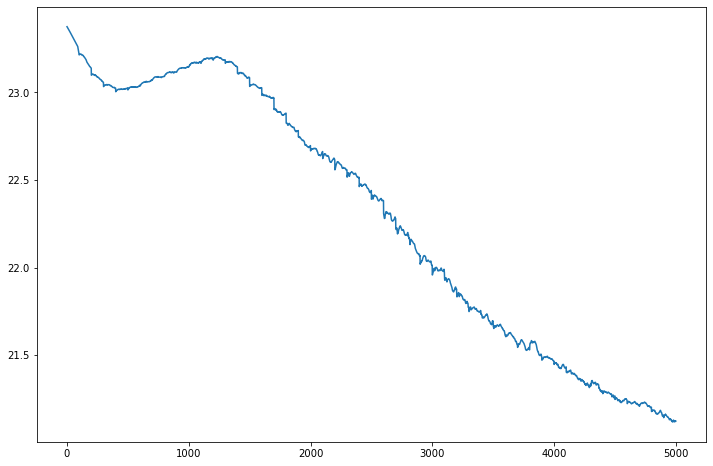

In [137]:
df.Cal_T.plot()

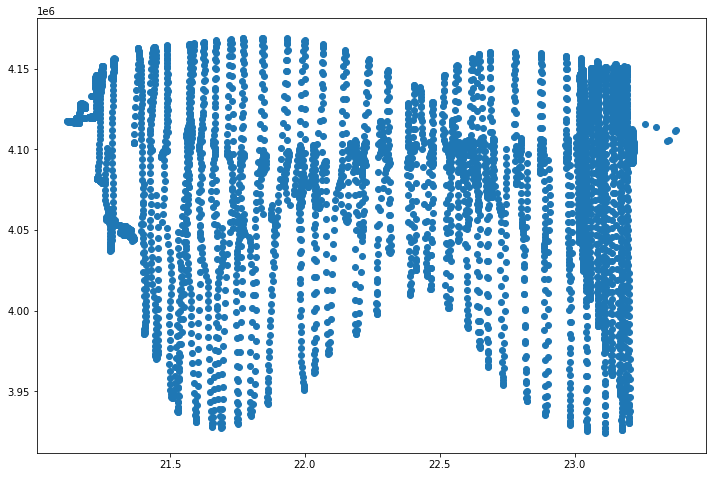

In [138]:
fig, ax = plt.subplots()
ax.scatter(df.Cal_T, df.MAG_B_RAW)